# **Практическая работа №6. Проектирование автоэнкодеров для решения прикладных задач**


## **Задание №1. Реализуйте автоэнкодер для колоризации чёрно-белых изображений**



* **Чем больше объектов разных классов будет в исходном датасете, тем универсальнее будет работа обученной Вами модели**

> Например, если в Вашем датасете только кошки, то все объекты кроме кошек будут колоризоваться некорректно. Соответственно следует очень тщательно подойти к выбору датасета.

  * Для решения данной задачи может подойти датасет [CIFAR-100](https://www.kaggle.com/datasets/fedesoriano/cifar100), но его минус заключается в том, что разрешение изображений довольно низкое

* Хорошим вариантом будет использование датасета [ImageNet](https://paperswithcode.com/dataset/imagenet), но ввиду его объёмности, процесс обучения займет большое количество времени, поэтому Вы можете использовать одну из его [сокращенных версий](https://www.kaggle.com/datasets/ifigotin/imagenetmini-1000)



In [ ]:
# Загрузка изображений
import kagglehub

# Download latest version
path = kagglehub.dataset_download("ifigotin/imagenetmini-1000")

print("Path to dataset files:", path)

100%|██████████| 3.92G/3.92G [00:46<00:00, 90.9MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/ifigotin/imagenetmini-1000/versions/1


In [ ]:
!cp -r /root/.cache/kagglehub/datasets/ifigotin/imagenetmini-1000/versions/1/imagenet-mini /content/dataset

In [1]:
train_path = "/content/dataset/train"
val_path = "/content/dataset/val"

In [3]:
import os
import cv2
import numpy as np

def load_images(data_path, limit=1000, img_size=128):
    X_gray = []
    X_color = []

    count = 0

    for root, dirs, files in os.walk(data_path):
        for file in files:
            if count >= limit:
                return np.array(X_gray), np.array(X_color)

            img_path = os.path.join(root, file)

            img = cv2.imread(img_path)
            if img is None:
                continue

            img = cv2.resize(img, (img_size, img_size))

            # цвет
            color = img / 255.0

            # grayscale
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            gray = gray / 255.0
            gray = np.expand_dims(gray, axis=-1)

            X_color.append(color)
            X_gray.append(gray)

            count += 1

    return np.array(X_gray), np.array(X_color)

In [4]:
X_gray_train, X_color_train = load_images(train_path, limit=2000)
X_gray_val, X_color_val = load_images(val_path, limit=500)

In [5]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Model

input_img = Input(shape=(128, 128, 1))

# Encoder
x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# Decoder
x = Conv2D(128, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

# модель
autoencoder = Model(input_img, decoded)

In [7]:
autoencoder.compile(
    optimizer='adam',
    loss='mse'
)
autoencoder.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 128, 128, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 32)     │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 128, 128, 3)    │           867 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 333,379 (1.27 MB)

 Trainable params: 333,379 (1.27 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
history = autoencoder.fit(
    X_gray_train, X_color_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_gray_val, X_color_val)
)

Epoch 1/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0417 - val_loss: 0.0233
Epoch 2/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0202 - val_loss: 0.0195
Epoch 3/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0182 - val_loss: 0.0182
Epoch 4/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0171 - val_loss: 0.0174
Epoch 5/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0170 - val_loss: 0.0173
Epoch 6/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0162 - val_loss: 0.0167
Epoch 7/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0161 - val_loss: 0.0164
Epoch 8/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0158 - val_loss: 0.0162
Epoch 9/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0157 - val_loss: 0.0161
Epoch 10/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0153 - val_loss: 0.0160
Epoch 11/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 0.0150 - val_loss: 0.0158
Epoch 12/50
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


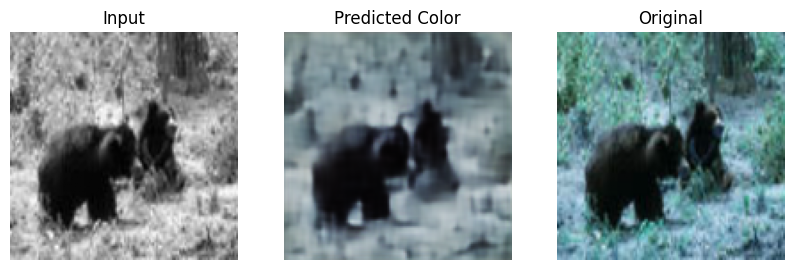

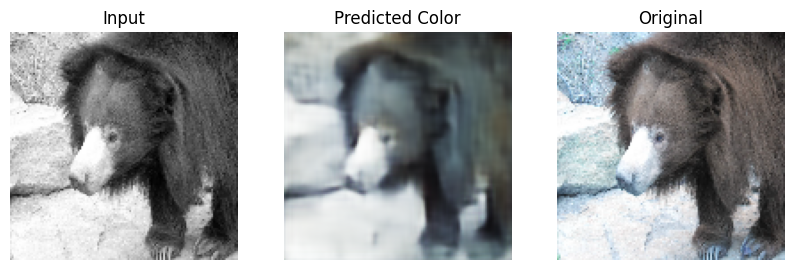

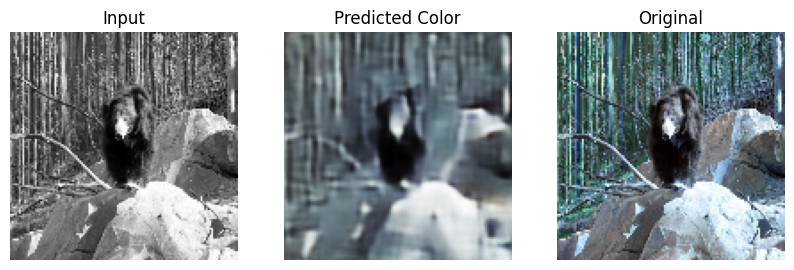

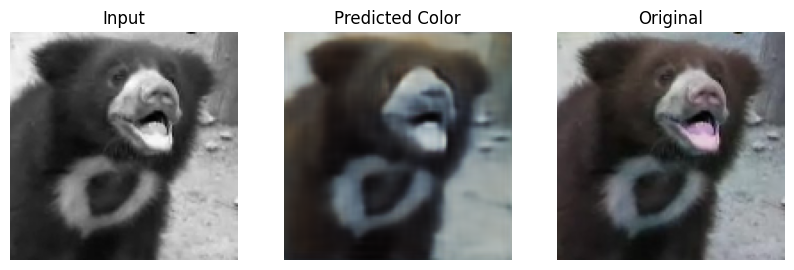

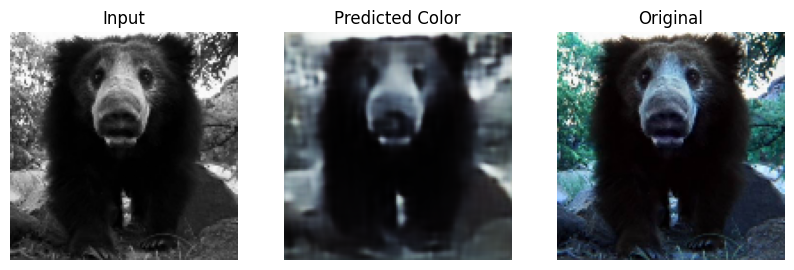

In [12]:
import matplotlib.pyplot as plt

# предсказание
preds = autoencoder.predict(X_gray_val[:5])

for i in range(5):
    plt.figure(figsize=(10,3))

    # входное изображение (gray)
    plt.subplot(1,3,1)
    plt.axis('off')
    plt.imshow(X_gray_val[i].squeeze(), cmap='gray')
    plt.title("Input")

    # предсказание
    plt.subplot(1,3,2)
    plt.axis('off')
    plt.imshow(preds[i])
    plt.title("Predicted Color")

    # оригинал
    plt.subplot(1,3,3)
    plt.axis('off')
    plt.imshow(X_color_val[i])
    plt.title("Original")


    plt.show()

 **Конечный выбор датасета осуществляется по Вашему желанию (хорошо, если это будут Ваши датасеты), учитывая рекомендации приведенные выше.**


Saving flamingo.jpg to flamingo (2).jpg
Saving great grey owl.jpg to great grey owl (2).jpg
Saving green mamba.jpg to green mamba (2).jpg
Saving tree frog.jpg to tree frog (2).jpg
Saving white stork.jpg to white stork (2).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


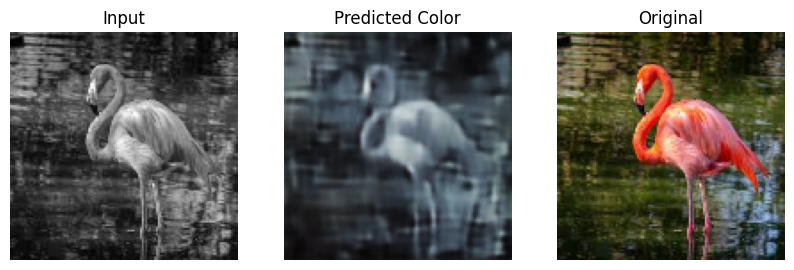

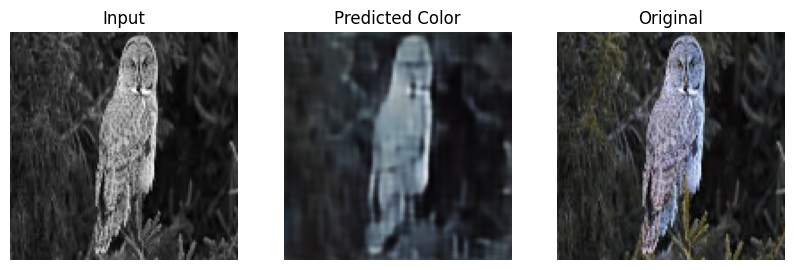

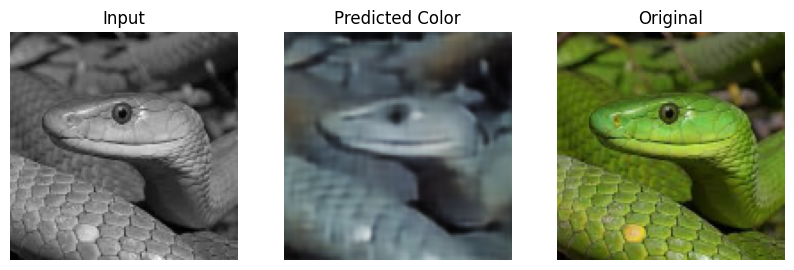

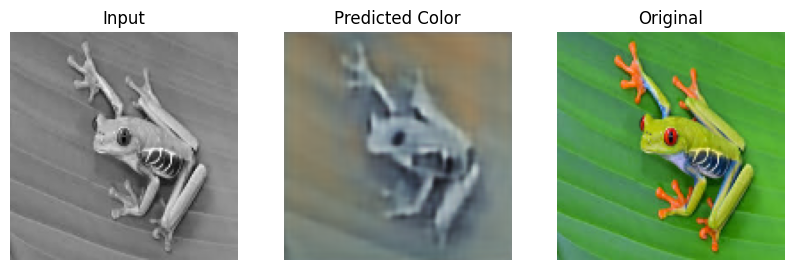

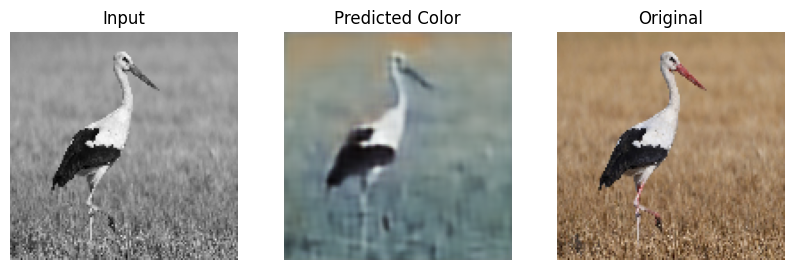

In [15]:
# Ваш код
import cv2
import numpy as np
import matplotlib.pyplot as plt

from google.colab import files
uploaded = files.upload()

IMG_SIZE = 128

results = []

# обработка и предсказание
for filename in uploaded.keys():
    file_bytes = np.frombuffer(uploaded[filename], np.uint8)
    img = cv2.imdecode(file_bytes, cv2.IMREAD_COLOR)

    if img is None:
        continue

    # resize
    original = cv2.resize(img, (IMG_SIZE, IMG_SIZE))

    # grayscale
    gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
    gray_norm = gray / 255.0
    gray_input = np.expand_dims(gray_norm, axis=(0, -1))  # (1, H, W, 1)

    # предсказание
    pred = autoencoder.predict(gray_input)[0]

    results.append((gray, pred, original))

# визуализация
for gray, pred, original in results:
    plt.figure(figsize=(10,3))

    # вход
    plt.subplot(1,3,1)
    plt.axis('off')
    plt.imshow(gray, cmap='gray')
    plt.title("Input")

    # предсказание
    plt.subplot(1,3,2)
    plt.axis('off')
    plt.imshow(pred)
    plt.title("Predicted Color")

    # оригинал
    plt.subplot(1,3,3)
    plt.axis('off')
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title("Original")

    plt.show()

## **Задание №2. Реализуйте автоэнкодер для удаления шума на однотипных изображениях**



1.  Подберите датасет, состоящий из однотипных изображений, которые в реальной жизни часто подвержены зашумлению, например спутниковые снимки, ночные фотографии и т.д.

2.  Затем примените к ним операцию зашумления и обучите модель. Также учитывайте тип шума, который Вы применяете. Он должен быть приближен к естественному.

Хороший пример реализации подобной задачи: https://www.kaggle.com/code/michalbrezk/denoise-images-using-autoencoders-tf-keras

In [22]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("eduardo4jesus/stanford-cars-dataset")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'stanford-cars-dataset' dataset.
Path to dataset files: /kaggle/input/stanford-cars-dataset


In [23]:
!cp -r /root/.cache/kagglehub/datasets/eduardo4jesus/stanford-cars-dataset/versions/1 /content/dataset/cars_1

In [26]:
train_path = "/content/dataset/cars_1/cars_train/cars_train"
test_path  = "/content/dataset/cars_1/cars_test/cars_test"

X_clean_train = load_images(train_path, limit=3000)
X_clean_val   = load_images(test_path, limit=500)

Train: (3000, 128, 128, 3)
Val: (500, 128, 128, 3)


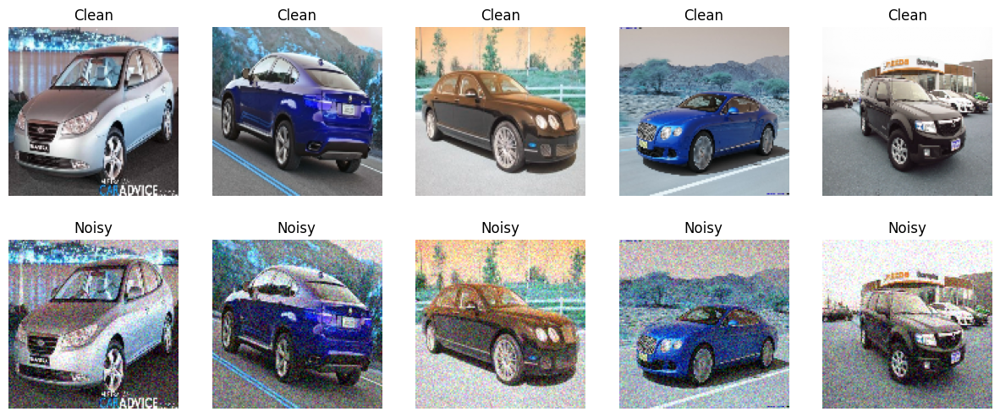

In [34]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

IMG_SIZE = 128

# загрузка изображений
def load_images(folder, limit=2000):
    images = []
    count = 0

    for file in os.listdir(folder):
        if count >= limit:
            break

        img_path = os.path.join(folder, file)
        img = cv2.imread(img_path)

        if img is None:
            continue

        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = img / 255.0

        images.append(img)
        count += 1

    return np.array(images)

# пути
train_path = "/content/dataset/cars_1/cars_train/cars_train"
test_path  = "/content/dataset/cars_1/cars_test/cars_test"

# загрузка данных
X_clean_train = load_images(train_path, limit=3000)
X_clean_val   = load_images(test_path, limit=500)

print("Train:", X_clean_train.shape)
print("Val:", X_clean_val.shape)


# добавление шума
def add_noise(images):
    noise_factor = 0.1
    noisy = images + noise_factor * np.random.normal(
        loc=0.0, scale=1.0, size=images.shape
    )
    return np.clip(noisy, 0.0, 1.0)

X_noisy_train = add_noise(X_clean_train)
X_noisy_val   = add_noise(X_clean_val)


# визуализация
def display(clean, noisy, denoised=None):
    n = 5
    indices = np.random.randint(len(clean), size=n)

    plt.figure(figsize=(15, 6))

    for i, idx in enumerate(indices):
        # оригинал
        ax = plt.subplot(3 if denoised is not None else 2, n, i + 1)
        plt.imshow(clean[idx])
        plt.title("Clean")
        plt.axis("off")

        # шум
        ax = plt.subplot(3 if denoised is not None else 2, n, i + 1 + n)
        plt.imshow(noisy[idx])
        plt.title("Noisy")
        plt.axis("off")

        # denoised (если есть)
        if denoised is not None:
            ax = plt.subplot(3, n, i + 1 + 2*n)
            plt.imshow(denoised[idx])
            plt.title("Denoised")
            plt.axis("off")

    plt.show()


display(X_clean_train, X_noisy_train)

In [29]:
input_img = Input(shape=(128, 128, 3))

# Encoder
x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)

x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# Decoder
x = Conv2D(128, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder = Model(input_img, decoded)

In [30]:
autoencoder.compile(optimizer='adam', loss='mse')

autoencoder.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 16, 16, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 32, 32, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_4 (UpSampling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 64, 64, 32)     │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_5 (UpSampling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 128, 128, 3)    │           867 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 333,955 (1.27 MB)

 Trainable params: 333,955 (1.27 MB)

 Non-trainable params: 0 (0.00 B)

In [31]:
history = autoencoder.fit(
    X_noisy_train, X_clean_train,
    epochs=50,
    batch_size=32,
    validation_data=(X_noisy_val, X_clean_val)
)

Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - loss: 0.0297 - val_loss: 0.0166
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.0153 - val_loss: 0.0137
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0134 - val_loss: 0.0124
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0123 - val_loss: 0.0120
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.0118 - val_loss: 0.0115
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.0110 - val_loss: 0.0111
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.0105 - val_loss: 0.0105
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.0101 - val_loss: 0.0098
Epoch 9/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0100 - val_loss: 0.0095
Epoch 10/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0.0094 - val_loss: 0.0095
Epoch 11/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - loss: 0.0091 - val_loss: 0.0095
Epoch 12/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - loss: 0

In [32]:
# Ваш код
preds = autoencoder.predict(X_noisy_val)

16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step


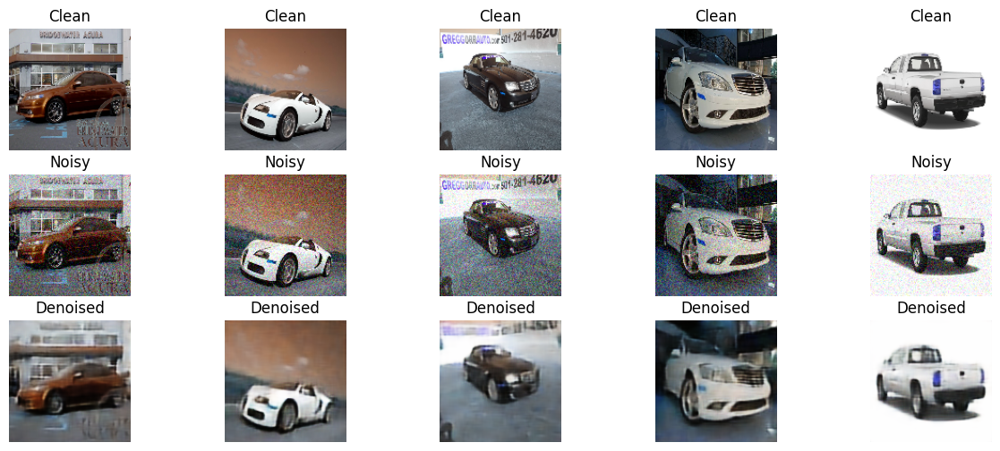

In [35]:
display(X_clean_val, X_noisy_val, preds)

Saving images (1).jpg to images (1) (1).jpg
Saving images (2).jpg to images (2) (1).jpg
Saving images (3).jpg to images (3) (1).jpg
Saving images (4).jpg to images (4) (1).jpg
Saving images.jpg to images (5).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


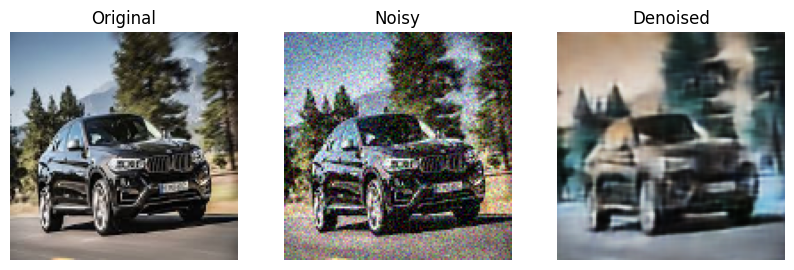

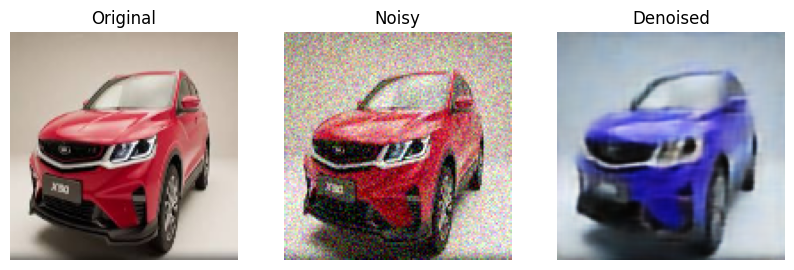

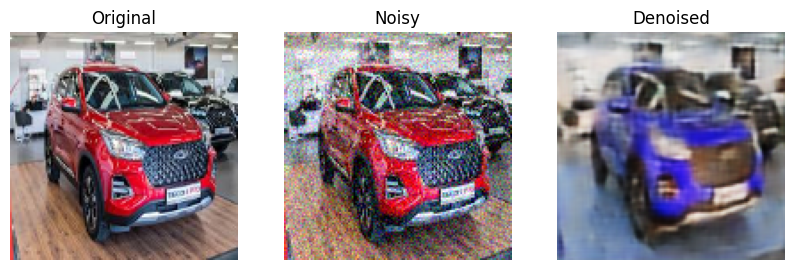

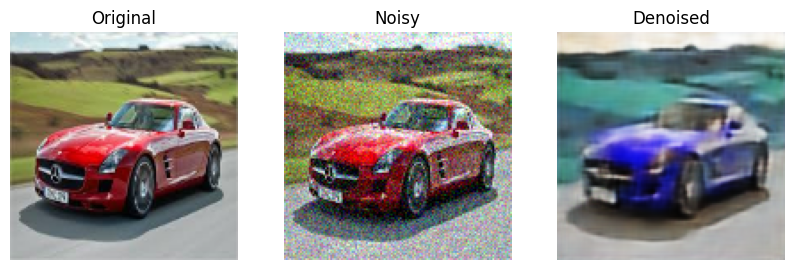

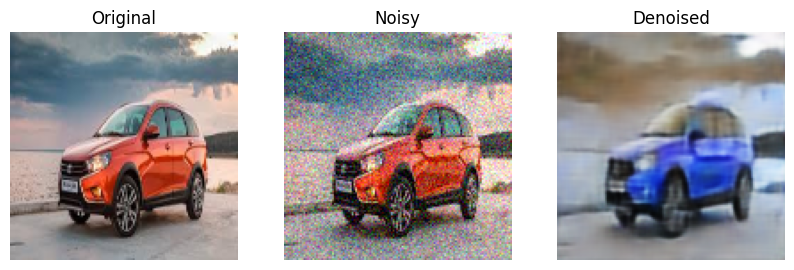

In [37]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from google.colab import files
uploaded = files.upload()

IMG_SIZE = 128

results = []

for filename in uploaded.keys():
    file_bytes = np.frombuffer(uploaded[filename], np.uint8)
    img = cv2.imdecode(file_bytes, cv2.IMREAD_COLOR)

    if img is None:
        continue

    # resize
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img = img / 255.0

    # добавляем шум
    noise_factor = 0.1
    noisy = img + noise_factor * np.random.normal(0, 1, img.shape)
    noisy = np.clip(noisy, 0., 1.)

    # предсказание
    pred = autoencoder.predict(np.expand_dims(noisy, axis=0))[0]

    results.append((img, noisy, pred))

for clean, noisy, pred in results:
    plt.figure(figsize=(10,3))

    # оригинал
    plt.subplot(1,3,1)
    plt.imshow(cv2.cvtColor((clean * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
    plt.title("Original")
    plt.axis("off")

    # шум
    plt.subplot(1,3,2)
    plt.imshow(cv2.cvtColor((noisy * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
    plt.title("Noisy")
    plt.axis("off")

    # очистка
    plt.subplot(1,3,3)
    plt.imshow(pred)
    plt.title("Denoised")
    plt.axis("off")

    plt.show()

## **Задание №.3 Реализуйте автоэнкодер для улучшения качества изображения путём увеличения его разрешения (апскейлинг-[определение](https://dic.academic.ru/dic.nsf/ruwiki/346555))**



1. На входной слой нейронной сети подаётся изображение с размерностью (256, 256,3) - X_test. В результате работы нейронной сети на выходном слое должно получиться изображение (512, 512, 3) - Y_test. В итоге мы получаем двукратный апскейл исходного изображения.

2. Датасет собираете из изображений, разрешение которых выше эталонного (512,512,3). Затем преобразуете их в указанные размерности и формируете из них обучающую и проверочную выборку.

3. Обучите модель. Отобразите графики обучения

4. Подумайте, каким образом можно будет адаптировать модель вашей нейронной сети для двухратного апскейла изображения с любой размерностью, большей, чем (256,256,3), с полным или частичным сохранением его исходных пропорций. Например: подаём на вход изображение с разрешением (1920, 1080, 3) - получаем изображение с разрешением (3840, 2160, 3), т.е. с полным сохранением исходных пропорций или (1792, 1024, 3) с частичным сохранением исходных пропорций.

> Подсказка: Для этого можно реализовать алгоритм предварительной обработки исходного изображения, перед подачей его в нейронную сеть

In [2]:
import os
import cv2
import numpy as np

def load_superres_data(folder, limit=2000):
    X = []
    Y = []

    count = 0

    for file in os.listdir(folder):
        if count >= limit:
            break

        path = os.path.join(folder, file)
        img = cv2.imread(path)

        if img is None:
            continue

        # high-res (target)
        high = cv2.resize(img, (512, 512))
        high = high / 255.0

        # low-res (input)
        low = cv2.resize(img, (256, 256))
        low = low / 255.0

        X.append(low)
        Y.append(high)

        count += 1

    return np.array(X), np.array(Y)

In [3]:
train_path = "/content/dataset/cars_1/cars_train/cars_train"
test_path  = "/content/dataset/cars_1/cars_test/cars_test"

X_train, Y_train = load_superres_data(train_path, limit=500)
X_val, Y_val     = load_superres_data(test_path, limit=100)

In [4]:
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D
from tensorflow.keras.models import Model

input_img = Input(shape=(256, 256, 3))

# encoder
x = Conv2D(64, (3,3), activation='relu', padding='same')(input_img)
x = Conv2D(64, (3,3), activation='relu', padding='same')(x)

# upscaling
x = UpSampling2D((2,2))(x)

# decoder
x = Conv2D(64, (3,3), activation='relu', padding='same')(x)
x = Conv2D(32, (3,3), activation='relu', padding='same')(x)

output = Conv2D(3, (3,3), activation='sigmoid', padding='same')(x)

model = Model(input_img, output)
model.compile(optimizer='adam', loss='mse')

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 256, 256, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 512, 512, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 512, 512, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 512, 512, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 512, 512, 3)    │           867 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 94,979 (371.01 KB)

 Trainable params: 94,979 (371.01 KB)

 Non-trainable params: 0 (0.00 B)

In [5]:
history = model.fit(
    X_train, Y_train,
    epochs=30,
    batch_size=16,
    validation_data=(X_val, Y_val)
)

Epoch 1/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 94s 2s/step - loss: 0.0420 - val_loss: 0.0079
Epoch 2/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 18s 574ms/step - loss: 0.0044 - val_loss: 0.0033
Epoch 3/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 18s 563ms/step - loss: 0.0029 - val_loss: 0.0035
Epoch 4/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 18s 558ms/step - loss: 0.0027 - val_loss: 0.0022
Epoch 5/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 18s 568ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 6/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 18s 570ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 7/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 18s 567ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 8/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 18s 565ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 9/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 18s 564ms/step - loss: 0.0014 - val_loss: 0.0013
Epoch 10/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 18s 567ms/step - loss: 0.0015 - val_loss: 0.0017
Epoch 11/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 18s 569ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 12/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 18s 5

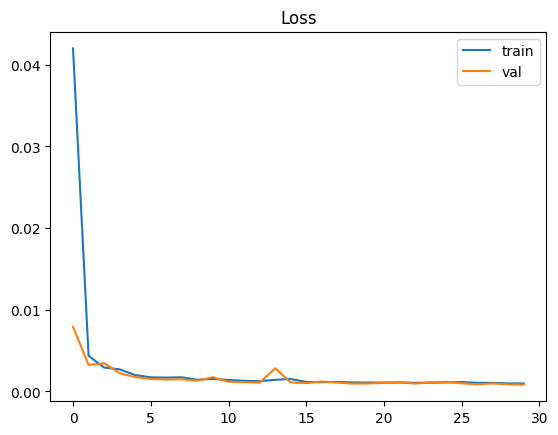

In [6]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.legend()
plt.title("Loss")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


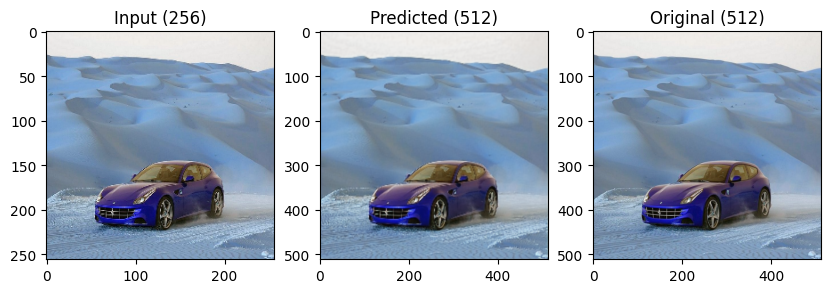

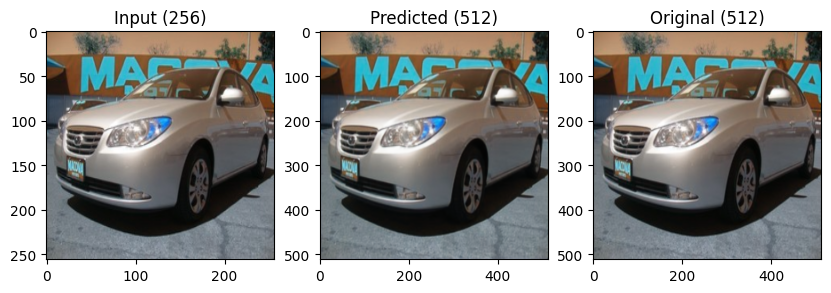

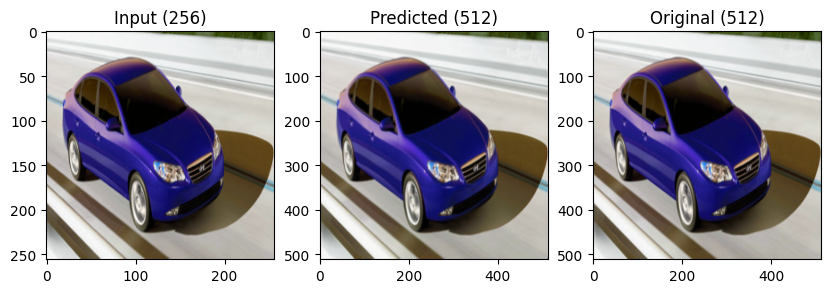

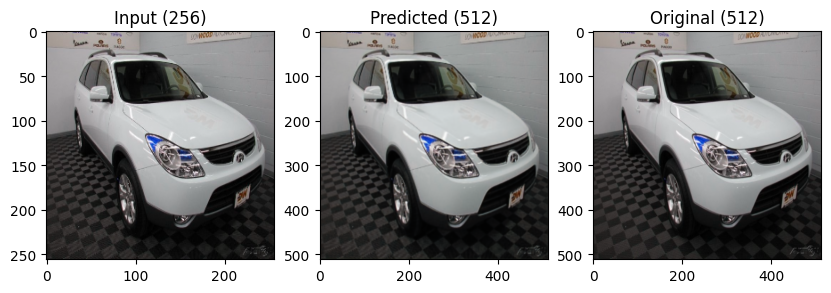

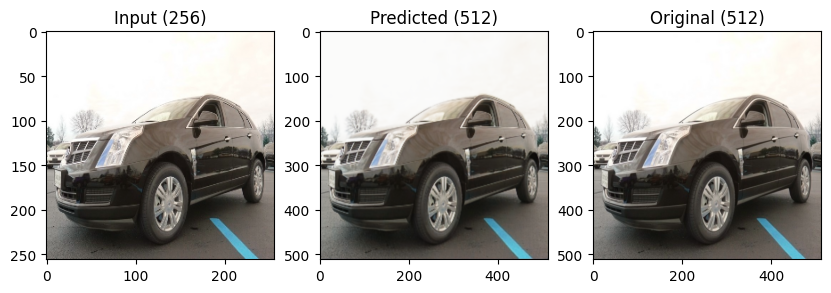

In [7]:
preds = model.predict(X_val[:5])

for i in range(5):
    plt.figure(figsize=(10,3))

    # low-res
    plt.subplot(1,3,1)
    plt.imshow(X_val[i])
    plt.title("Input (256)")

    # predicted
    plt.subplot(1,3,2)
    plt.imshow(preds[i])
    plt.title("Predicted (512)")

    # original
    plt.subplot(1,3,3)
    plt.imshow(Y_val[i])
    plt.title("Original (512)")

    plt.show()

Saving images (1).jpg to images (1) (2).jpg
Saving images (2).jpg to images (2) (2).jpg
Saving images (3).jpg to images (3) (2).jpg
Saving images (4).jpg to images (4) (2).jpg
Saving images.jpg to images (6).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


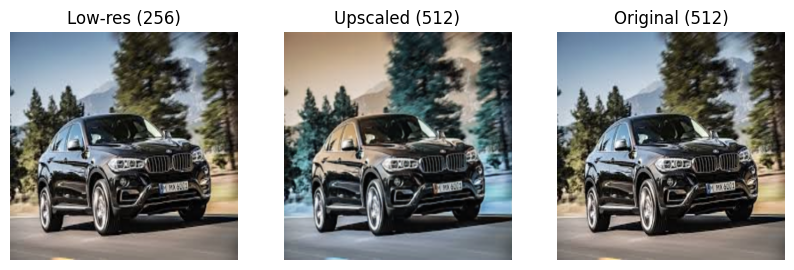

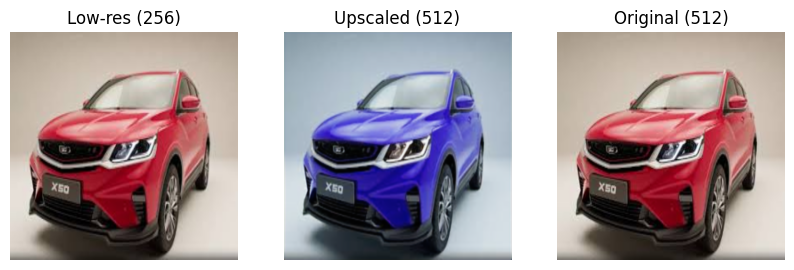

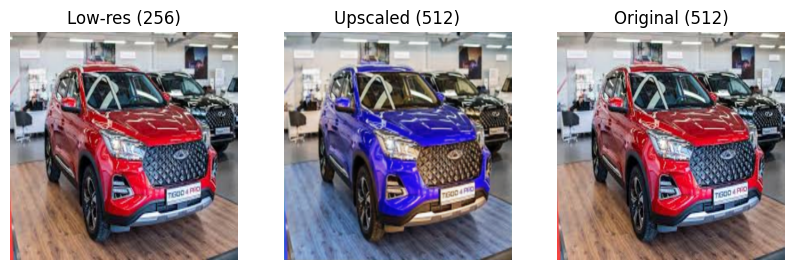

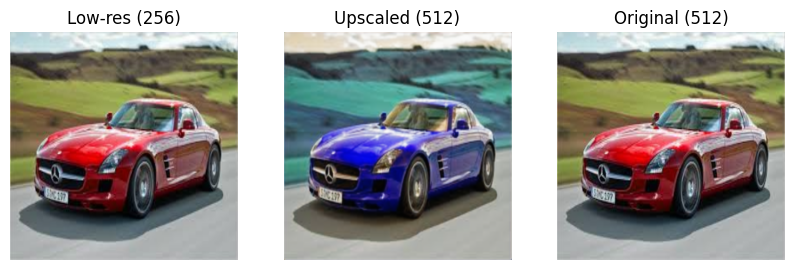

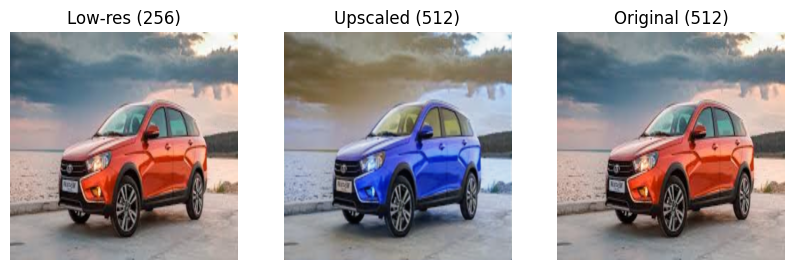

In [8]:
# Ваш код
import cv2
import numpy as np
import matplotlib.pyplot as plt

from google.colab import files
uploaded = files.upload()

LOW_SIZE = 256   # вход
HIGH_SIZE = 512  # выход

results = []

for filename in uploaded.keys():
    # читаем изображение
    file_bytes = np.frombuffer(uploaded[filename], np.uint8)
    img = cv2.imdecode(file_bytes, cv2.IMREAD_COLOR)

    if img is None:
        continue

    # 512
    original = cv2.resize(img, (HIGH_SIZE, HIGH_SIZE))
    original = original / 255.0

    # 256
    low = cv2.resize(original, (LOW_SIZE, LOW_SIZE))

    # апскейл
    pred = model.predict(np.expand_dims(low, axis=0))[0]

    results.append((low, pred, original))

# визуализация
for low, pred, original in results:
    plt.figure(figsize=(10,3))

    # low-res
    plt.subplot(1,3,1)
    plt.imshow(cv2.cvtColor((low * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
    plt.title("Low-res (256)")
    plt.axis("off")

    # predicted
    plt.subplot(1,3,2)
    plt.imshow(pred)
    plt.title("Upscaled (512)")
    plt.axis("off")

    # original
    plt.subplot(1,3,3)
    plt.imshow(cv2.cvtColor((original * 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
    plt.title("Original (512)")
    plt.axis("off")

    plt.show()